<a href="https://colab.research.google.com/github/Gabriel-dev576/Estad-stica-I-y-ll/blob/main/Estadistica_I.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plot
import pandas as pd
import io
from google.colab import files
import seaborn as sns
import numpy as np
from scipy.stats import norm
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import shapiro
from scipy.stats import shapiro
import numpy as np
from scipy.stats import skew , kurtosis
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr , kendalltau

In [1]:
uploaded = files.upload()

Saving nac2022 (2).csv to nac2022 (2).csv


In [6]:
io_csv = io.BytesIO(uploaded['nac2022 (2).csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)

/tmp/ipython-input-1554608682.py:4: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')


,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
8,638,1,1,NaN,1,4,4,2022,12,1,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
11,1,1,1,NaN,1,6,5,2022,12,1,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
27,1,1,1,NaN,2,6,5,2022,12,1,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1


In [57]:
df=tabla[["EDAD_PADRE", "EDAD_MADRE" , "N_HIJOSV"]]
df.head(3)

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4


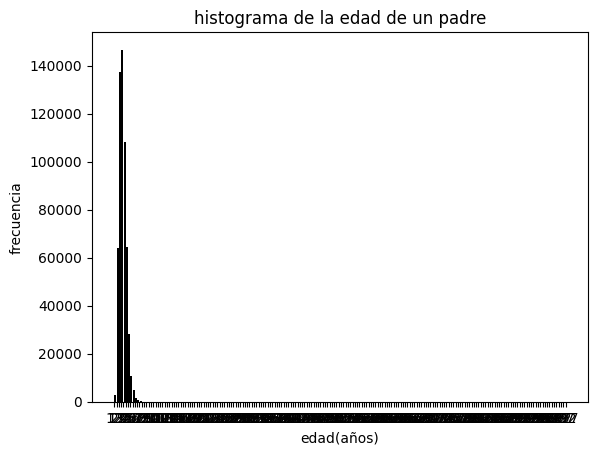

In [17]:
intervalos = range(min(df.EDAD_PADRE), max(df.EDAD_PADRE)+1 , 5)
plot.title('histograma de la edad de un padre')
plot.xlabel('edad(años)')
plot.ylabel('frecuencia')
plot.hist(df.EDAD_PADRE, bins=intervalos , color ='black', rwidth=0.85)
plot.xticks(intervalos)
plot.show()

In [18]:
df1 = df[(df.EDAD_PADRE<120) & (df.EDAD_MADRE !=99) & (df.N_HIJOSV !=99)]
df1.head(5)

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4
8,29,4,2
76,21,3,1


/tmp/ipython-input-2943195714.py:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k' , linewidth = 2 , label= 'Distribucion normal' , color = "blue")


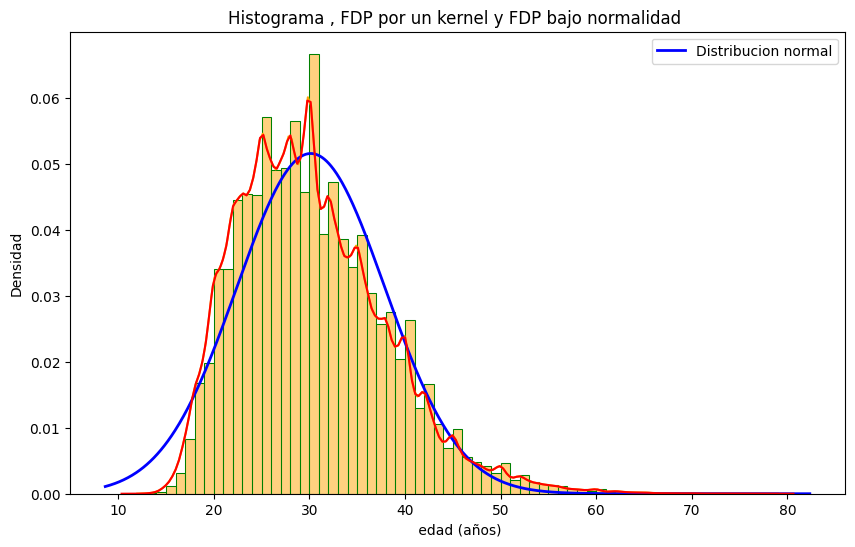

In [34]:
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)
plot.figure(figsize=(10,6))
sns.histplot(x=df1.EDAD_PADRE, bins=intervalos1 , kde= True, stat='density', color='orange', edgecolor='green')

xmin, xmax = plt.xlim ()
x = np.linspace(xmin,xmax,1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE) , np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k' , linewidth = 2 , label= 'Distribucion normal' , color = "blue")


sns.kdeplot(x=df1.EDAD_PADRE , color="red")



plt.title('Histograma , FDP por un kernel y FDP bajo normalidad ')
plt.xlabel(' edad (años)')
plt.ylabel('Densidad')
plt.legend()

plt.show()

In [35]:
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 568276.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9627148118717348), pvalue=np.float64(1.919587188982723e-116))

In [36]:
df1.EDAD_PADRE.count()

np.int64(568276)

In [40]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100)
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=np.float64(0.8829582377356574), pvalue=np.float64(2.42637642311259e-07))

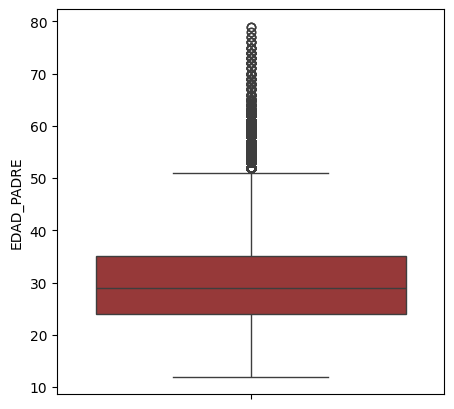

In [42]:
plt.figure(figsize=(5,5))
sns.boxplot(df1.EDAD_PADRE , color = 'brown' , saturation=0.75)
plt.show()

In [56]:
plt.figure(figsize=(5,5))
fig= px.strip(df1.EDAD_PADRE , orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>

In [44]:
def calcular_estadisticas(datos):
  media = np.mean(datos)
  varianza=np.var(datos)
  asimetria = skew(datos)
  curtosis =kurtosis(datos)
  return media,varianza, asimetria , curtosis
media,varianza , asimetria , curtosis = calcular_estadisticas(df1.EDAD_PADRE)

print(f"media: {media}")
print(f"varianza: {varianza}")
print(f"asimetria: {asimetria}")
print(f"curtosis: {curtosis}")

media: 30.148239587805925
varianza: 59.92624560757446
asimetria: 0.7932649439125867
curtosis: 0.8974620245423521


In [45]:
print(f"media:{np.mean(df1.EDAD_PADRE)}")
print(f"varianza: {np.var(df1.EDAD_PADRE)}")
print(f"asimetria: {skew(df1.EDAD_PADRE)}")
print(f"curtosis: {kurtosis(df1.EDAD_PADRE)}")

media:30.148239587805925
varianza: 59.92624560757446
asimetria: 0.7932649439125867
curtosis: 0.8974620245423521


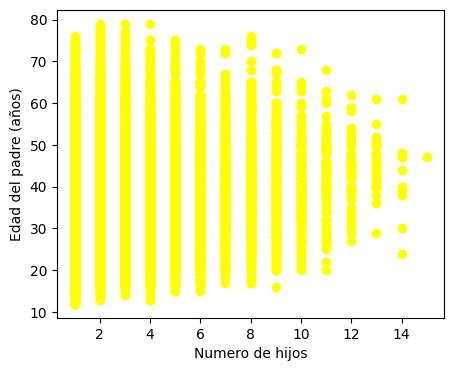

In [48]:
plt.figure(figsize=(5,4))
plt.scatter(df1["N_HIJOSV"], df1["EDAD_PADRE"], color= "yellow"  , marker= "o")
plt.xlabel('Numero de hijos')
plt.ylabel('Edad del padre (años)')
plt.show()

In [49]:
modelo = LinearRegression()
# df1 ["N_HIJOSV"] es igual a escribir df1.N_HIJOSV
modelo.fit(np.array(df1.N_HIJOSV).reshape(-1,1), np.array (df1["EDAD_PADRE"]).reshape(-1,1))
predi_lineal = modelo.predict(np.array(df1.N_HIJOSV).reshape(-1,1))
predi_lineal

array([[30.29315726],
       [30.29315726],
       [34.62354964],
       ...,
       [30.29315726],
       [32.45835345],
       [30.29315726]])

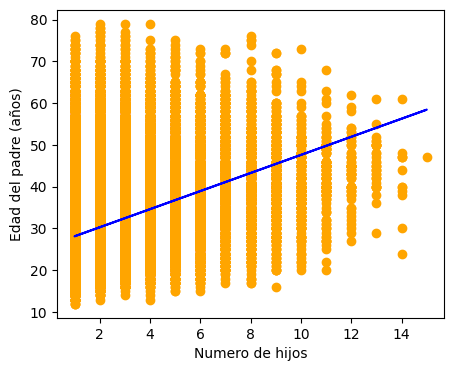

In [50]:
plt.figure(figsize=(5,4))
plt.scatter(df1["N_HIJOSV"], df1["EDAD_PADRE"], color = "orange", marker ='o')
plt.plot(df1["N_HIJOSV"], predi_lineal , linestyle='-', color="blue")
plt.xlabel('Numero de hijos')
plt.ylabel('Edad del padre (años)')
plt.show()

In [55]:
coef_pearson = np.corrcoef(df1["N_HIJOSV"] , df1["EDAD_PADRE"]) [0,1]
coef_spearman, _ = spearmanr(df1["N_HIJOSV"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_HIJOSV"], df1["EDAD_PADRE"])
print(f"los coeficientes de correlacion de pearson , Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}")

los coeficientes de correlacion de pearson , Spearman y Kendall son respectivamente 0.3308429858965031, 0.3563003702777745 y 0.28081560831586566
